In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline

In [2]:
#data.shape

In [3]:
#data = pd.read_csv("amazon_reviews.txt", delimiter = "\t")
# data = pd.read_csv("data_with_unknown_words_count.csv")
data = pd.read_csv("feature_engineered_new_fake_dataset.csv")
#data = pd.read_csv("productinfo.txt", delimiter = "\t",nrows=100)

In [4]:
data.head(3)

,Unnamed: 0,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT,TEXT_LENGTH,num_sentences,emojis,FK_Score,FE_Score,stop_count,caps_count,pos_count,pos_count_new,matchesDf
0,0,1,Fake,2,N,PC,B00008NG7N,"Targus PAUK10U Ultra Mini USB Keypad, Black",useful,"When least you think so, this product will sav...",116,3,0,1.9,102.10,10,2,"Counter({'PRP': 4, 'RB': 4, 'NN': 4, 'VBP': 2,...",26,7
1,1,2,Fake,2,Y,Wireless,B00LH0Y3NM,Note 3 Battery : Stalion Strength Replacement ...,New era for batteries,Lithium batteries are something new introduced...,404,4,0,15.6,44.92,28,4,"Counter({'NN': 14, 'JJ': 9, 'IN': 8, 'DT': 7, ...",76,24
2,2,3,Fake,2,N,Baby,B000I5UZ1Q,"Fisher-Price Papasan Cradle Swing, Starlight",doesn't swing very well.,I purchased this swing for my baby. She is 6 m...,248,6,0,2.6,94.76,25,6,"Counter({'PRP': 9, 'RB': 7, 'VBZ': 6, 'IN': 5,...",60,5


In [5]:
data.shape

(21000, 20)

In [6]:
data.PRODUCT_CATEGORY.unique()

array(['PC', 'Wireless', 'Baby', 'Office Products', 'Beauty',
       'Health & Personal Care', 'Toys', 'Kitchen', 'Furniture',
       'Electronics', 'Camera', 'Sports', 'Home', 'Jewelry', 'Books',
       'Grocery', 'Video DVD', 'Tools', 'Home Improvement', 'Shoes',
       'Outdoors', 'Luggage', 'Video Games', 'Apparel', 'Lawn and Garden',
       'Pet Products', 'Home Entertainment', 'Musical Instruments',
       'Watches', 'Automotive'], dtype=object)

In [7]:
data.loc[data["LABEL"] == "__label1__", "LABEL"] = 'Fake'
data.loc[data["LABEL"] == "__label2__", "LABEL"] = 'Real'

## LABEL VS UNKNOWN WORD COUNT

In [8]:
# df = data[data.UNKNOWN_WORDS_COUNT!=12 ]

In [9]:
# df = df[df.UNKNOWN_WORDS_COUNT!=14 ]

In [10]:
# df = df[df.UNKNOWN_WORDS_COUNT!=15 ]

In [11]:
# pd.crosstab(df['UNKNOWN_WORDS_COUNT'], df['LABEL'])#.apply(lambda r: r/r.sum(), axis=1)

In [12]:
# pd.crosstab(df['UNKNOWN_WORDS_COUNT'], df['LABEL']).apply(lambda r: r/r.sum(), axis=1).plot(kind='bar', stacked=True)

## ALBEL VS verified_purchase and RAting

In [13]:
combine = [data]
Score_mapping = {1: 1, 2: 1, 3: 2, 4: 2, 5: 3}
for dataset in combine:
    dataset['RATING'] = dataset['RATING'].map(Score_mapping)
    dataset['RATING'] = dataset['RATING'].fillna(0)

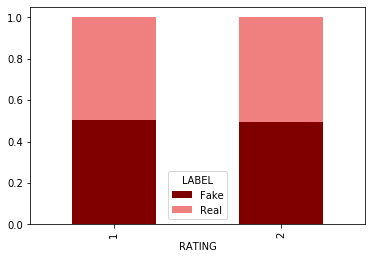

In [14]:
pd.crosstab(data['RATING'], data['LABEL']).apply(lambda r: r/r.sum(), axis=1).plot(kind='bar', stacked=True,color= ["maroon","lightcoral"])

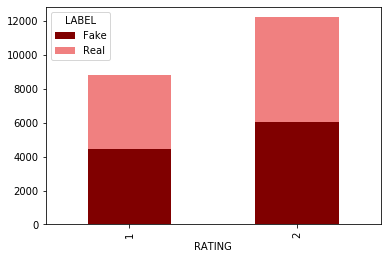

In [15]:
pd.crosstab(data['RATING'], data['LABEL']).plot(kind='bar', stacked=True,color= ["maroon","lightcoral"])

In [16]:
pd.crosstab(data['RATING'], data['LABEL'])

LABEL,Fake,Real
RATING,,
1,4441,4349
2,6059,6151


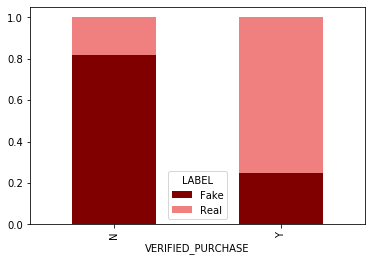

In [17]:
pd.crosstab(data['VERIFIED_PURCHASE'], data['LABEL']).apply(lambda r: r/r.sum(), axis=1).plot(kind='bar', stacked=True,color= ["maroon","lightcoral"])

## product type vs label 

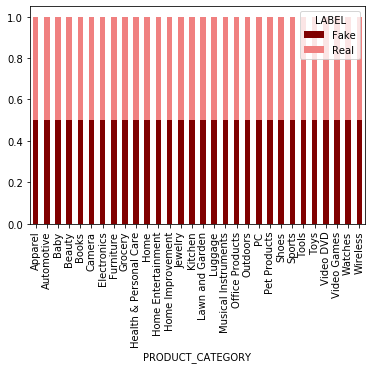

In [18]:
pd.crosstab(data['PRODUCT_CATEGORY'], data['LABEL']).apply(lambda r: r/r.sum(), axis=1).plot(kind='bar', stacked=True,color= ["maroon","lightcoral"])

## product category extraction


In [19]:
# df1=data[data.PRODUCT_CATEGORY.isin(['Electronics'])]

In [20]:
# df1.shape

In [21]:
# df1=pd.DataFrame(df1)

In [22]:
# df1.to_csv("fakeelectronicsdataset_new.csv")

## review length vs label

In [23]:
df1 = data.groupby("LABEL").REVIEW_TEXT
data['TEXT_LENGTH'] = data['REVIEW_TEXT'].apply(len)
cnt_srs = data.groupby(["LABEL"]).TEXT_LENGTH.agg(lambda x: sum(x)/len(x))
cnt_srs

LABEL
Fake    316.550000
Real    428.102857
Name: TEXT_LENGTH, dtype: float64

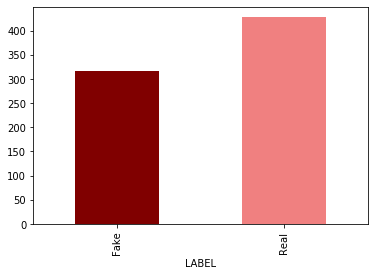

In [24]:
cnt_srs.plot(kind='bar', stacked=True,color= ["maroon","lightcoral"])

In [25]:
# plt.figure(figsize=(16,8))
# sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8, color=color[0])
# plt.ylabel('Text Length', fontsize=16)
# plt.xlabel('Label', fontsize=16)
# plt.title('Text length Vs Label', fontsize=18)
# plt.xticks(rotation='horizontal')
# plt.show()

## FKscore vs label

In [26]:
data['num_sentences'] = data['REVIEW_TEXT'].apply(lambda x: len(str(x).split('.')))
#data['num_syllable'] = data['REVIEW_TEXT'].apply(lambda x: len(str(x).split('')))

In [27]:
!pip3 install textstat

  Using cached https://files.pythonhosted.org/packages/4f/b9/49f8bd4604122dd7d618a1f7440c00e2b3505d2a8307642a28260f8a3004/textstat-0.6.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/15/82/08a3629dce8d1f3d91db843bb36d4d7db6b6269d5067259613a0d5c8a9db/Pyphen-0.9.5-py2.py3-none-any.whl


In [28]:
import textstat
#from textstat import flesch_kincaid_grade

from textstat.textstat import textstat
data["FK_Score"] = data["REVIEW_TEXT"].apply(textstat.flesch_kincaid_grade)


In [29]:
cnt_srs = data.groupby(["LABEL"]).FK_Score.agg(lambda x: sum(x)/len(x))
cnt_srs


LABEL
Fake     8.007886
Real    13.803848
Name: FK_Score, dtype: float64

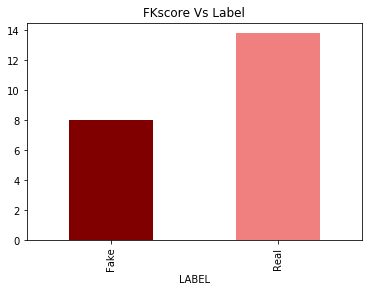

In [30]:
cnt_srs.plot(kind='bar', stacked=True,color= ["maroon","lightcoral"],title=("FKscore Vs Label"))

In [31]:
# plt.figure(figsize=(5,8))
# sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.5)
# plt.ylabel('FKscore', fontsize=16)
# plt.xlabel('Label', fontsize=16)
# plt.title('FKscore Vs Label', fontsize=18)
# plt.xticks(rotation='horizontal')
# plt.show()

## stop sord count vs label

In [32]:
import nltk
wpt = nltk.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words('english')


In [33]:
def stopCount(x):
    sum =0
    for char in x.split():
        sum+= char in stop_words
    return sum
data['stop_count'] = data['REVIEW_TEXT'].apply(stopCount)


In [34]:
cnt_srs = data.groupby(["LABEL"]).stop_count.agg(lambda x: sum(x)/len(x))
cnt_srs

LABEL
Fake    24.696190
Real    32.519048
Name: stop_count, dtype: float64

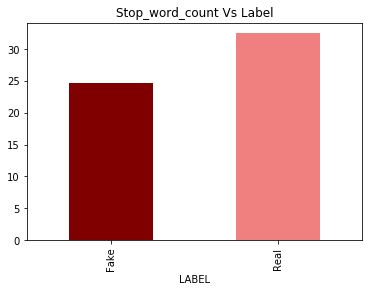

In [35]:
cnt_srs.plot(kind='bar', stacked=True,color= ["maroon","lightcoral"],title=("Stop_word_count Vs Label"))

## product name matches vs label

In [36]:
import re
import string
match_list = []

def checkName(title,text):
    matches = []
    for word in title.split():
        #removing punctuation
        word = "".join((char for char in word if char not in string.punctuation))
        #print(word)
        myreg = r'\b'+word+r'\b'
        r = re.compile(myreg, flags=re.I | re.X)
        matches.append(r.findall(text))
    return len(matches)
        

for a,b in zip(data.PRODUCT_TITLE, data.REVIEW_TEXT):
    number_of_matches = checkName(a,b)
    match_list.append(number_of_matches)
    
data["matchesDf"] = match_list

In [37]:
cnt_srs = data.groupby(["LABEL"]).matchesDf.agg(lambda x: sum(x)/len(x))
cnt_srs

LABEL
Fake    13.823143
Real    10.570667
Name: matchesDf, dtype: float64

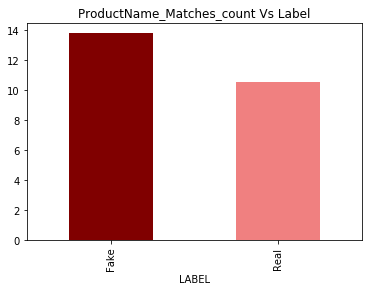

In [38]:
cnt_srs.plot(kind='bar', stacked=True,color= ["maroon","lightcoral"],title=("ProductName_Matches_count Vs Label"))

In [39]:
data.head(3)

,Unnamed: 0,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT,TEXT_LENGTH,num_sentences,emojis,FK_Score,FE_Score,stop_count,caps_count,pos_count,pos_count_new,matchesDf
0,0,1,Fake,1,N,PC,B00008NG7N,"Targus PAUK10U Ultra Mini USB Keypad, Black",useful,"When least you think so, this product will sav...",116,3,0,1.9,102.10,10,2,"Counter({'PRP': 4, 'RB': 4, 'NN': 4, 'VBP': 2,...",26,7
1,1,2,Fake,1,Y,Wireless,B00LH0Y3NM,Note 3 Battery : Stalion Strength Replacement ...,New era for batteries,Lithium batteries are something new introduced...,404,4,0,15.6,44.92,28,4,"Counter({'NN': 14, 'JJ': 9, 'IN': 8, 'DT': 7, ...",76,24
2,2,3,Fake,1,N,Baby,B000I5UZ1Q,"Fisher-Price Papasan Cradle Swing, Starlight",doesn't swing very well.,I purchased this swing for my baby. She is 6 m...,248,6,0,2.6,94.76,25,6,"Counter({'PRP': 9, 'RB': 7, 'VBZ': 6, 'IN': 5,...",60,5


# FAKE REVIEW CLASSIFIER

In [40]:
import pandas as pd
import nltk
from sklearn.model_selection import train_test_split
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('wordnet')
import string
import csv
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from random import shuffle
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from nltk.classify import SklearnClassifier
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn import preprocessing
from sklearn.utils import shuffle

[nltk_data] Downloading package punkt to /home/sidathm/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/sidathm/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [41]:
data = shuffle(data)

In [42]:
data.head(3)

,Unnamed: 0,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT,TEXT_LENGTH,num_sentences,emojis,FK_Score,FE_Score,stop_count,caps_count,pos_count,pos_count_new,matchesDf
16419,16419,16420,Real,1,Y,Jewelry,B0088F87SG,"Starter Master 7"" Bracelet- Removable Lobster ...",Very disappointed !!,The bracelet that I received (3 days before Ch...,335,7,0,8.5,68.81,24,9,"Counter({'DT': 9, 'NN': 9, 'IN': 8, 'PRP': 6, ...",72,16
13423,13423,13424,Real,1,Y,Apparel,B006EXMIMK,"Baby Soy Janey Baby Organic Footie, 3-6M, Mala...",Too small,"Granted my baby is a little larger than most, ...",298,4,0,6.3,85.32,29,6,"Counter({'RB': 8, 'IN': 7, 'NN': 6, 'DT': 6, '...",64,12
2266,2266,2267,Fake,1,N,Shoes,B004I59YNC,"Sam Edelman Women's Petty Ankle Bootie,Putty,9...",Very comfortable,Very comfortable bootines that I can dance in ...,200,3,0,3.5,92.42,16,4,"Counter({'PRP': 6, 'NN': 6, 'JJ': 5, 'RB': 4, ...",43,8


In [43]:
data.LABEL.replace(['__label1__', '__label2__'], ['fake', 'real'], inplace=True)
data.LABEL.value_counts()

/home/sidathm/.local/lib/python3.6/site-packages/pandas/core/generic.py:6786: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


Fake    10500
Real    10500
Name: LABEL, dtype: int64

In [44]:
df=data.drop(['DOC_ID','Unnamed: 0'], axis=1)

In [45]:
#data.drop(['Unnamed: 0'], axis=1)

In [46]:
df.shape

(21000, 18)

In [47]:
table = str.maketrans({key: None for key in string.punctuation})
def tokenize(text):
    # Should return a list of tokens
    lemmatizer = WordNetLemmatizer()
    filtered_tokens=[]
    lemmatized_tokens = []
    stop_words = set(stopwords.words('english'))
    text = text.translate(table)
    for w in text.split(" "):
        if w not in stop_words:
            lemmatized_tokens.append(lemmatizer.lemmatize(w.lower()))
        filtered_tokens = [' '.join(l) for l in nltk.bigrams(lemmatized_tokens)] + lemmatized_tokens
    return filtered_tokens

In [48]:
df['preProcessedText'] = df['REVIEW_TEXT'].apply(tokenize)
df.head()

,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT,TEXT_LENGTH,num_sentences,emojis,FK_Score,FE_Score,stop_count,caps_count,pos_count,pos_count_new,matchesDf,preProcessedText
16419,Real,1,Y,Jewelry,B0088F87SG,"Starter Master 7"" Bracelet- Removable Lobster ...",Very disappointed !!,The bracelet that I received (3 days before Ch...,335,7,0,8.5,68.81,24,9,"Counter({'DT': 9, 'NN': 9, 'IN': 8, 'PRP': 6, ...",72,16,"[the bracelet, bracelet i, i received, receive..."
13423,Real,1,Y,Apparel,B006EXMIMK,"Baby Soy Janey Baby Organic Footie, 3-6M, Mala...",Too small,"Granted my baby is a little larger than most, ...",298,4,0,6.3,85.32,29,6,"Counter({'RB': 8, 'IN': 7, 'NN': 6, 'DT': 6, '...",64,12,"[granted baby, baby little, little larger, lar..."
2266,Fake,1,N,Shoes,B004I59YNC,"Sam Edelman Women's Petty Ankle Bootie,Putty,9...",Very comfortable,Very comfortable bootines that I can dance in ...,200,3,0,3.5,92.42,16,4,"Counter({'PRP': 6, 'NN': 6, 'JJ': 5, 'RB': 4, ...",43,8,"[very comfortable, comfortable bootines, booti..."
6239,Fake,2,Y,Home,B00IUIA73Y,"Touch Light, Danibos 2pcs DIY Stick-on 4-LED T...",Great light!,The light is very shinny. Battery does last lo...,294,6,0,4.4,90.09,27,7,"Counter({'NN': 7, 'PRP': 7, 'DT': 6, 'RB': 6, ...",68,25,"[the light, light shinny, shinny battery, batt..."
20285,Real,2,Y,Jewelry,B00N3YS3D6,His or Hers Matching Set Couple Titanium Stain...,II Love it it is for me and my boyfriend of ...,II Love it it is for me and my boyfriend of th...,193,1,0,14.6,69.12,25,12,"Counter({'PRP': 13, 'VBP': 5, 'CC': 4, 'IN': 3...",44,22,"[ii love, love boyfriend, boyfriend three, thr..."


In [49]:
df=df.drop(['PRODUCT_ID','PRODUCT_TITLE','REVIEW_TITLE'], axis=1)

In [50]:
df.head()

,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,REVIEW_TEXT,TEXT_LENGTH,num_sentences,emojis,FK_Score,FE_Score,stop_count,caps_count,pos_count,pos_count_new,matchesDf,preProcessedText
16419,Real,1,Y,Jewelry,The bracelet that I received (3 days before Ch...,335,7,0,8.5,68.81,24,9,"Counter({'DT': 9, 'NN': 9, 'IN': 8, 'PRP': 6, ...",72,16,"[the bracelet, bracelet i, i received, receive..."
13423,Real,1,Y,Apparel,"Granted my baby is a little larger than most, ...",298,4,0,6.3,85.32,29,6,"Counter({'RB': 8, 'IN': 7, 'NN': 6, 'DT': 6, '...",64,12,"[granted baby, baby little, little larger, lar..."
2266,Fake,1,N,Shoes,Very comfortable bootines that I can dance in ...,200,3,0,3.5,92.42,16,4,"Counter({'PRP': 6, 'NN': 6, 'JJ': 5, 'RB': 4, ...",43,8,"[very comfortable, comfortable bootines, booti..."
6239,Fake,2,Y,Home,The light is very shinny. Battery does last lo...,294,6,0,4.4,90.09,27,7,"Counter({'NN': 7, 'PRP': 7, 'DT': 6, 'RB': 6, ...",68,25,"[the light, light shinny, shinny battery, batt..."
20285,Real,2,Y,Jewelry,II Love it it is for me and my boyfriend of th...,193,1,0,14.6,69.12,25,12,"Counter({'PRP': 13, 'VBP': 5, 'CC': 4, 'IN': 3...",44,22,"[ii love, love boyfriend, boyfriend three, thr..."


In [51]:
# featureDict = {} # A global dictionary of features

# def toFeatureVector(Rating, verified_Purchase, product_Category, tokens, TEXT_LENGTH, FK_Score, stop_count, matchesDf):
#     localDict = {}
    
# #Rating

#     #print(Rating)
#     featureDict["R"] = 1   
#     localDict["R"] = Rating
    
# # text length(TL)
#     featureDict["TL"] = 1
#     localDict["TL"] = TEXT_LENGTH
    
# # fk_score (FK)
#     featureDict["FK"] = 1
#     localDict["FK"] = FK_Score

# #stop_count
#     featureDict["SC"] = 1
#     localDict["SC"] = stop_count
    
# # matchesDF
#     featureDict["MD"] = 1
#     localDict["MD"] = matchesDf

# #Verified_Purchase
  
#     featureDict["VP"] = 1
            
#     if verified_Purchase == "N":
#         localDict["VP"] = 0
#     else:
#         localDict["VP"] = 1

# #Product_Category

    
#     if product_Category not in featureDict:
#         featureDict[product_Category] = 1
#     else:
#         featureDict[product_Category] = +1
            
#     if product_Category not in localDict:
#         localDict[product_Category] = 1
#     else:
#         localDict[product_Category] = +1
            
            
# #Text        

#     for token in tokens:
#         if token not in featureDict:
#             featureDict[token] = 1
#         else:
#             featureDict[token] = +1
            
#         if token not in localDict:
#             localDict[token] = 1
#         else:
#             localDict[token] = +1
    
#     return localDict

In [95]:
featureDict = {} # A global dictionary of features

def toFeatureVector(Rating, verified_Purchase, product_Category, TEXT_LENGTH, FK_Score, stop_count, matchesDf, num_sentences, emojis, caps_count, pos_count_new):
    localDict = {}
    
#Rating

    #print(Rating)
    featureDict["R"] = 1   
    localDict["R"] = Rating
    
# text length(TL)
    featureDict["TL"] = 1
    localDict["TL"] = TEXT_LENGTH
    
# fk_score (FK)
    featureDict["FK"] = 1
    localDict["FK"] = FK_Score

#stop_count
    featureDict["SC"] = 1
    localDict["SC"] = stop_count
    
# matchesDF
    featureDict["MD"] = 1
    localDict["MD"] = matchesDf

#Verified_Purchase
  
    featureDict["VP"] = 1
            
    if verified_Purchase == "N":
        localDict["VP"] = 0
    else:
        localDict["VP"] = 1

# num_sentences
    featureDict["NUMS"] = 1
    localDict["NUMS"] = num_sentences

# emojis
    featureDict["EMOJ"] = 1
    localDict["EMOJ"] = emojis

# caps_count
    featureDict["CAPS_CNT"] = 1
    localDict["CAPS_CNT"] = caps_count

# pos_count_new
    featureDict["POS_CNT"] = 1
    localDict["POS_CNT"] = pos_count_new

#Product_Category

    
    if product_Category not in featureDict:
        featureDict[product_Category] = 1
    else:
        featureDict[product_Category] = +1
            
    if product_Category not in localDict:
        localDict[product_Category] = 1
    else:
        localDict[product_Category] = +1
                
    return localDict

In [96]:
rawData = []
trainData = []
testData = []

In [97]:
def loadData():
    for index, row in df.iterrows():
        rawData.append((row['RATING'], row['VERIFIED_PURCHASE'], row['PRODUCT_CATEGORY'], row['REVIEW_TEXT'], row['LABEL'], row['TEXT_LENGTH'], row['FK_Score'], row['stop_count'], row['matchesDf'], row['num_sentences'], row['emojis'], row['caps_count'], row['pos_count_new']));

In [98]:
loadData()

In [99]:
def preProcess(text):
    # Should return a list of tokens
    lemmatizer = WordNetLemmatizer()
    filtered_tokens=[]
    lemmatized_tokens = []
    stop_words = set(stopwords.words('english'))
    text = text.translate(table)
    for w in text.split(" "):
        if w not in stop_words:
            lemmatized_tokens.append(lemmatizer.lemmatize(w.lower()))
        filtered_tokens = [' '.join(l) for l in nltk.bigrams(lemmatized_tokens)] + lemmatized_tokens
    return filtered_tokens

### tf_idf

In [100]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

In [101]:
#Importing libraries 
import nltk 
import re 
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer 
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
import pandas as pd 


In [102]:
df2=df[["LABEL","REVIEW_TEXT"]]

In [103]:
df2

,LABEL,REVIEW_TEXT
16419,Real,The bracelet that I received (3 days before Ch...
13423,Real,"Granted my baby is a little larger than most, ..."
2266,Fake,Very comfortable bootines that I can dance in ...
6239,Fake,The light is very shinny. Battery does last lo...
20285,Real,II Love it it is for me and my boyfriend of th...
...,...,...
20926,Real,Fit into the boot no problem. Comfortable fro...
3347,Fake,"Nice quality, seems very durable. Great & funn..."
13784,Real,"For each pay check I received, I am planning t..."
6919,Fake,This is a great genuine sandalwood mala for me...


In [104]:
# for i in range(df.shape[0]):
#     print(i)
#     txt1.append(df.REVIEW_TEXT[i])
# Preprocessing 
def remove_string_special_characters(s): 
      
    # removes special characters with ' ' 
    stripped = re.sub('[^a-zA-z\s]', '', s) 
    stripped = re.sub('_', '', stripped) 
      
    # Change any white space to one space 
    stripped = re.sub('\s+', ' ', stripped) 
      
    # Remove start and end white spaces 
    stripped = stripped.strip() 
    if stripped != '': 
            return stripped.lower()    

df2["special_charac"]=df2['REVIEW_TEXT'].apply(remove_string_special_characters)       
          
 

/home/sidathm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [105]:
# Stopword removal  
def stop_word_remove(text):
    stop_words = set(stopwords.words('english')) 
    stop_words = set(stopwords.words('english'))   
    txt1 = ' '.join([x for x in nltk.word_tokenize(text) if ( x not in stop_words)])
    print(txt1)
    return txt1    
                                                  
                            
df2["special_charac"]=df2['special_charac'].apply(stop_word_remove)       
                        

bracelet received days christmas wasnt even one pictured lobster clasp extender christmas gift daughteri ordered one specifically dont like type closures bracelets exact kind gotvery disappointed
granted baby little larger runs way small shrunk significantly wash also buttons spaced way far apart arent warm chilly nights still put good ones used laundry
comfortable bootines dance evening wish leather theyd last long time wonderful price point updated look middle aged lady
light shinny battery last long light large area decide buy one local shopbut much expensive one go buy another set light good part rotate degreeslove
ii love boyfriend three times love match may teens fashion day buy truly beautiful happy
purchased kit riding normal pedals longest time wanted improve cycling easy install bike simple adjust shoe seems well built decent quality little small riding miles broken fitting betterbr br right away noticed power speed cadence improve proper placement pedals youre looking go cli

life made coffee drip machine k cups son came home school brought home french press could believe much better coffee tasted needed ownbr zyk french press easy use easy clean love coffee stainless steel screen system grinds get coffee cup also great teabr better easier way make coffee way coffee suppose taste
annoying small cover effectively seals spout would suction wet tried pour water would leak around actually cause lid fly water go everywhere even tried creating notch plastic cover avail one cover obviously solves issue slightly less annoying carbon bits would leak main pitcher far bits two thumbs
review ceramic blade ceramic blade cuts fruits vegetables beautiful thin slices like light easy wash prepared apple cinnamon chips moment got mandoline slicer thing suggest careful fortunately already metal gloves kitchen metal gloves tool great match slicing fruits vegetables mandoline slicer like walk park
bought house sold weeks keep mind diligence house still needs look good instructi

gloves well worth money leather nice quality happy give gift nicer gloves seen cost nearly twice much received quickly pleased purchase
could wear since showed since almost breaking okay though since needed one time play looked great great thing played huge part
issue product net end stick torn easily cant use poop falls right
marker good might skip set altogether since going worth end caddy pretty disappointing save trouble skipping altogether
got wedding gift last week seemed cheapy looking forward using many things got total bust broke us nd vegetable threw garbage needs made much better people please buy quality gifts give cash
briefly describe ask specifically improved obvious weakness purchasing crank connects directly lift ring umbrella string feeds main pole
great dane puppy course loves chewon everything purchased toy absolutely loves chewed face couple weeks still good shapeif little dirty like fact small parts chew choke kong products resilient highly recommend
first introdu

flashcards praxis ii school psychologist exam top line obviously took great pains make sure provided necessary information clear concise way cause confusion cards even extra space write notes reword definition try
bought year old niece christmas gift loved drawing painting since christmas delivery prompt good price
item described hard headphones still work laptop great months bought would recommend
ive used tide pods laundry detergent many yearsits great detergent use nice scent leaver cloths smelling fresh
lock appears tough bought two survived flights thailand another way home unlike lock prevents strap loosened although guess someone could still cut strap keep one suit case intact tsr broke latches suit case
purchased tv costco last night anything substance changes ill take time post update sharp tv month far pretty pleased purchase second sharp tv reason also bought ive really pleased sharp httpfavecocwfhfn things worthy note much convenient able watch digital media directly tv rok

excellent read ties together events associated discovery early americabr history interest easy read
great defintely recommended anyone looking protectionbr right fit perfect nice color blue
perfect use charged quickly grow many types flowers especially lavender worked well harvesting end season clean
projector awesome compared price one thinking buying product buy without doubts
great find mattress made made natural materials could use little filling still nice pad helps regulate body temperature better polyester synthetic material pads
excellent product money easy setup streams netflix amazon prime etc tons music choices
works perfectly slightly longer neck old ones color warm white hard tell difference regular bulbs super fast shipping well
love shape flashlight feels right hands brightness light also really satisfying doesnt blind good thing
worth spending little wish would holes poles like one came however got thinks good time tell seemed like one came lasted years im hoping one la

actually cute piece jewelry daughter saw necklace really wanted thought match green dress really unexpected necklace match dress looked prettier dollar necklace looks expensive least dollars go waste
read several reviews buying net look back shouldnt wasted time item great easy set take great son learning ball years old great soccer also even golf box shows x version x version price time purchase obviously bought bigger one love item would recommend sure
wasnt expecting much price got young daughter unable wear studs go ear way big fit normal persons ear piercing
love selfie stick adjustable phone holder easy use rubber grip expensive smartphone wont ever hit ground love compact bluetooth camera button works like charm found easy use set right box always read instructions like others setting bluetooth would definitely recommend selfie stick
purchased item year old grandson difficulty following directions school spiderman item captured kept attention step step directions well illustrate

bought kit knowing full well may last longit didnt maybe got one load dried dryer broke end get new dryer
didnt like film count one disappointing viewings ever came unpleasant surprise considering names actors director impressions limited spoilersbr br emma natalie portman adam ashton kutcher unwillingly keep running one day get really close emma however reluctant idea relationship asks sex strings attached common operation adam much less cynical agrees hesitation totally understand natalie portman asks gods sake course things go smoothly supposedbr br general idea wasnt easiest thing world handled must give director ivan reitman even didnt make really good film since ghostbusters experienced veteran could definitely better thatbr br scenario weak potential main actors wasted couple jokes mostly turn around adams dad aging playboy played kevin kline time film definitely funny rarely good news comedy romance well hardly saw romantism butcher shopsbr br give film two stars generally like

setup easy sound clear sound sub gives right amount fill sound wireless feature makes set easy room x system handles easily set way go enjoy
id prefer coldpressed organic agave nectar sometimes buy price job im sure nutritional benefits
ive always liked ream products one fell short order load unmount phone use hands older style spring loaded jaws top quicker held phone secure new style
havent used meller spiralizer ton yet super excited initially ordered another less expensive brand ended cancelling order discovering hadnt shipped days placed order one reason chose meller brands hearread much wonderful costumer service began read reviews saw owners least representative meller answered large majority reviews complaints super impressive cancelled order ordered one shipped got days earlier expected far happy excited gal
didnt realize speakers work mhz opened box unfortunately quite lot static speakers amount static changes depending position speakers guess many gadgets days use frequency 

accurate consistent easy use calibration needed accidentally ordered instead ph tester isnt sellers fault looking ppm tester try one
ferrara pan candy company founded chicago illinois company hit new great tasting candy lemonheads tart sweet time huge success staple company later company spread making several flavors candy including cherryheads originally known cherry chans cherry clansbr br cherryheads delicious little red candies sweet tart great cherry taste admittedly sour newer supersour candies many candies give wave tasteless supersour get eat supersweet candy cherryheads get nice flavor tart cherries especially chew recommend br br growing chicagoland area ferrara pan candies staple every kids diet eating cherryheads takes back childhood buy cherryheads enjoy great candy highly recommend
actually belief hell real isnt funny matter devastating many children adults people suffer depression bipolar disorder fixation idea eternal painbr br fear hell price christians pay accepting p

accurate pellet ever shooting crossman premier hollow points crossman fury np shooting fps alloy dang pin point
putting together hard enough two ppl finish realize drawers metal installed straight drawers dont go evenly disappointing
bought boots job privet security company lot standing needed boot breathes giving boots stars due rough hard leather sole need nice insole set support feet preference perfect might different people told want good hard support gel sole ware start hurt cup heal comfortably two vent holes inside portion boots short recommend highly would advise buy drsholes somthing effect boot offers support insole buy icing cake
couldnt wait open well packaged shipped opened read booklet plugged reconfigure settings cakewalk audio output thing beautiful piece work
favorite pssega saturn era rpg great characters story may seem little light played ff first equally entertaining seems pretty dated nowadaysive spent way much time one still havent beat returning every winter im a

purchased tv last month living room tv saw great price decent reviews online boy regret buying itbr br wasnt days tv dead pixels forming quickly proceeded tell quality tv price next one hdmi ports proceeded fail cause screen fuzzy play around cord get picture back tried deal long could decided wasnt paid forbr br returning tv nightmare dont wish upon worst enemy wish would purchased quality tv begin withbr br dealing return purchased much better tv much cheaperbr br want quality inch tv check one amazon httpamzntoozwtlsbr br currently never happier great quality picture wasnt insanely expensive like tvs sale please save time frustration put throughbr br decide isnt tv least got share experience one
great design colors used mouse tried without mousepad works fineit feels great hand unlike previous mouse glad got great price well programmable buttons great multiple tasks well
purchase silicone whisk say really nice fit well hand worry scratching cookware great quality
good substitute win

cream smell bad good product hate cellulite remover cream
price tag xbox one rechargeable battery pack wireless controller affordable works without issue well thats need consider arming one case
sucks returning says stick um public flea market bent one fell
grandson loves weird creature plays constantlybr also takes long car trips visit
works great another one fuzzy reception really appreciative excellent quality plan order another one
jewel ring box looks good held rings room spare looked two months pick
ive using couple months must say price seems thing cheap shipped fast door days pleased
quality good dont expect much product cheap reason said long dont fill half way items hard chop works great
love convenient hiking want take photographs kids without pulling big camera pair iphone remote hisy great solution
hand weekly crossword arrives nice lead advanced twist nozzle rather click top allows smaller increments lead advanced thus wasteful click full pencils long regularly breaks wri

old car compartment put change since got new car lost compartment didnt spot hold change found product perfect covering change doenst spill fits nicely glove box
great light weight luggage normally worry luggage overweight always pack trip actually room spare gifts bring home mention ten pounds play luggage lightweight
child short haired given school role long hair child started irritated frustrated bought although really looks fake stopped child crying looks good shes practicing
clasp cheap construction face makes difficult read time looks really nice ive complimented times wont making another purchase brand
like patchouli like sandalwood get together blend nicely oil potent careful applying
absolutely love ocarina cant wait learn songs big sturdy beautiful stunning well tuned
usually wear evenings black dress black top brings blue eyes husband loves says eyes sparkle earings
perfect sitting porch enjoying morning coffee however easiest put together holes predrilled lined correctly ma

everytime went inside car leaving parking spot felt like sitting sun honest didnt money tint windows finding cheap way blocking suns light top priority saw shades mates car couldnt stop asking got themhe eventually told amazon next day bought using sun shades since day gladly say work like charm seats dont get heated like used sun doesnt bother friends
sony dvd player inexpensive option second third home dvd player put childrens playroom movie watching works fine purpose choice main dvd player lacks wifi capabilities streaming netflix pandora tube also ideal vacation home furnished rental property comes dvd players today one basic gets
youre like know pet another family member take dogbr everywhere unfortunately dont always know closest animalbr hospital kit made feel prepared came packing forbr camping trip doesnt take much space really surprised mebr since much stuff kit found venombr extraction pump could save best friends life animal needs bestbr care youre prepared situation compl

nothing much say interesting birthday card gift fellow friend surely make laugh well written birthday card inside made friend feel really excited picture outside well drawn overall pleasant look makes appealing cheap definitely worth price
thanks enjoy business allkeep good workthe iitem good shap every thing time
dog treats say price right dont eat still need four words finish
pillow meet standard expected son purchased one impressed second one returning first one second one firm sons first one second one label pillow recommend buying pillows never know might get comes expense returning
back yard best sunny days nothing perfect taking outdoor naps enjoy kind thing
cord meets expectations works great games controllers computer emulators helps people piece
several ks watches bags one faves cute without gaudy adds little splash color otherwise sedatelooking watch keeps excellent time ive never adjust great buy
watch impossible program get ironman gshock plus beeps hours impossible silenc

fit ford focus wagon perfectly old ones snap new ones snap minute job max
fantastic tool straighten crocked edge used garden shears work bought even used food processor blade handy tool recommend time
needed something bulky fits cards money turned better expected gave stars fits bill great quality price would highly recommend
bags cheap plastic zippers like might find dollar store ziploc bags second time using green bag zipper split open wash daughters delicate sweater came return window ended week ago im stuck crappy bags cant trust work intendedbr br bought small bag kaymart year ago much better quality held well youre shopping mesh bags obviously care clothes never thought id say one item buy person make sure good zippers
discovered start one finish minutes isnt long energized feel like different dvd workout time least daily always end stretch segment flows easily feels good stretches minutes gets day goingbr br gosh dont know set like best feel next day good way think felt fast cha

concept great sure many units service working mine doa instructions poor
thing dont like heateris parents camped long ago quickly heats tent easy use simple transport two one adult tent one kids tent dont go camping without
didnt like scent much maromas cedar lavender sort smells like neutral laundry detergent also rough moisturizing beads bar last though eventually splits due thin nature bar
wont say tastes terrible little odd im big fan neither friends
great small backpack large backpack needed day trip use camera raingear whatever need day
work perfectly application one single pocket door one double pocket door putting one side double door allows access either side door nicebr far glue held strong locking feature door opened freely nicebr issue unlocked opening door fins ride along inside pocket door make squealing noise closing door dont make noise lock disabled course make noise deserve full rating well see long last
vet recommended cats allergies one time herpes suspect thats sin

dad delivered doorstep complained computer desk didnt mean actually buy one certainly going get computer desk invest money get truly reliable one
chain fairly large gets attention good looking well made length perfect chain feels real smooth good value money
would recommend brand anybody seriously google search youll find brand reviews pretty good friend first got onto brand product skeptical first showed reviews product seeing intrigued decided get good choice frontbr br httpwwwamzngiftgpproductbwfqmsbr br great price super fast shipping ive bought several times past couple years last long brandsbr br like spreading word also ended posting review costcos website fyi far people seem taking review pretty wellbr br use real complaints hope continues case happy far recommend get thebr httpwwwamzngiftgpproductbcgbnsibr
good idea matter camera real fake long dissuades potential burglarsbr br look wise camera play part feel wise touch youll scream fakebr trick mount touchedbr br checked pric

really really liked nhbs garcinia ive taken double dose max weight loss suggested feel fine weeks im friends notice weight coming good friends said something way month supply cheapest
doesnt love combo pez chocolate im collector didnt open package ive great
achy hands cut fingers use stainless steel cable tie gun apply pressure tighten cable hose wire bundles remove excess cable ties clean installation
people reviews say ring runs small definitely run small went size shouldve gone size least oh well im going return ring ill give sister super cute though would recommend
whenever im free try wax car instead usual trip car wash something reminds lot dad used uses brand car products
received seeds quickl also got wonderful germination information along well hope great success comes time plant beauties tomo pilot dahlia seeds well packaged looked fresh sure fine hope update one planting season
little bit overweight whenever fly airlines hard put belt belt doesnt extend enough belt add lot e

love snack hempseeds theyre tasty texture similar sunflower seeds love make great addition salads light dishes give enough consistency help feel full since finding organic seeds ive noticed serious change eating habits really helped look feel better keep bag work munch throughout daybr br instances shelled seeds arent ideal though added flavor salads use hempseed oil [ [ asinbaaqyt nutiva organic hemp oil oz free cococare coconut oil fl oz ] ] instead perks different form taste pure blend hemp oil coconut oil together youll hooked perfect balance light dark without heavy bold tasting make lack omega consumption hempseeds even husband loves hes heavy chip snack eater
amazingly well researched carefully plotted wonderfully written book began reading book club choice time finished wanted buy dozen copies give best friends dont give may heard youre intelligent reader looking smart provocative impressive mystery teach many things read book
kids loved piata held long enough give thrill clubb

look set flashcards take testing material need fundamental payroll certification cards get practical details need worry getting information obsolete useless includes study material core payroll concepts calculation paycheck payroll process supporting systems administration testing objectives exam
got mostly novelty turned lot useful could expected bright goes well desk cheap like kind cheap thing
completely disappointed product returned first one thought damaged replacement came bad apparently thought damage poor quality product would recommend anyone purchase
far great resultsbr ive using epique months seen definite improvements skin dryness skin tone looks even less spots blotches area around lower cheekbones firm lifted tighter lookbr br bottle oz since using barely used even thats twice day application takes little moisturize tiny amount opinion works well enough one pumpbr br applying face notice rubs well absorbs really quickly sticky leave greasy feeling moisturizers many wrinkl

love containers homemade baby food clean easily dishwasher problems freezer refrigerator microwave lids tight leaking problem gaskets lids fall washing containers otherwise great buy
sea eagle shipped fast one day everything good shape opened xmas gift girlfriend thoroughly enjoyed kayak pumps quick foot pump stores quickly super quality expected sea eagle run aground bumped sticks rocks far punctures comes patches case comfortable pro package seats try competition secretly set arrive river time hard shell kayakers beat riverlake every time finish dry bit roll throw back car suv away go super nice apartmentsmall home space kayak really want one water vessel improved quality life
useful item tohopefullyprotect shipped items rough handling stick well bright enough noticed would order
nicely made small lady hands found small size tight tight enough provide moderate compression problem gloves get bit sweaty stick hands pulled unlike brand bought amazon last year also got bit rash base thum

drawback missmatched look rose design doesnt look foot havent used yet im unsure whether theyll scare fish away dont think theyll notice
little tv affordable use kitchen recipes software sucky certainly something would find apple operating system even makes windows look good buy bought watch mindless television kitchen like marta cooking shows
well written easy comprehend highly recommend ive read first couple chapters love
several sprout watches love nice purchase something company globally conscious corn resin case durable strap comfortable small wrist holes right place face easy read colors fun sorry color come felt strap another watch feature favorite comfort fit one note notice posted strap metal buckle many watches plastic resin sometimes allergic reaction metal watch bands far problem
really dont like parts small even would difficult time putting together much little nephew waste
looking product double price cast three wishes thing sucks need something hold camera clamp bar look

fantastic cute look fantastic girlfriend importantly loves thembr br come shipped professionally coming cute little bag inside one two earring boxes well done
first travel lot looking lightweight simple charger definitely key even charge lot usb devices home still nice every roombr br qicents dual usb wall charger solid charger plugs directly wall one piece charger looks great plugged two ports different ampage top one rated av designed charging tablets larger devices bottom one rated av designed charging smartphones smaller devicesbr br blue indicator light lets know charger plugged correctly pulling power nice sometimes dont push chargers way plus easy see dark overall excellent charger charger includes charger extra cables included also month warranty comes purchase know covered problems
awesome wonderful writing car windows daughter loves thembr br would definitely purchase great lot craft projects
purchased tow sharpeners received got impression high quality part solid designbut w

like taste biscuits lot use eat multiple packs per dat nothing happens digestive expected love flavor
seems working well product curb appetite feel energized weeks time ive dropped lbs
socks perform perfectly keep feet dry texas oilfield socks came time frame exactly described
love looks rugged durable light functions easy use band soft elastic anticipate band breaking falling apart l tire watch purchase replacement ezly available
money nice get away item rolls well stuffed clothes computer everything stayed put
really like much information many different actresses one resource learned lot actresses wouldnt otherwise known
way thick big fit shoes trim toes also sides could affect shape insole texture comfort quite good actually fits shoe
finally cover covers stays put cant tell many hard foam cups ive tried years reason cant seem get stay put pull tight house strap comes loose breaks leave gaps siding sock fits snug entire faucet house tie tightly want unsightly stores flat taking much

one gripping stories come across many years playing video games worth every cent
received gift anniversary love design earrings look great good quality
love bag use every single day college incredibly organized good size subject college ruled notebook text books two sets calculators room left things great quality price amazing honestly best bag ive ever bought quality function
received product mail monday although box sealed well seal bottle halfway open top wasnt tightened time got product almost half spilled box losing half product surprisingly good far picky senior cat wont eat anything dry kibble wet food whatsoever bit worried liquid making food soggy making eat due fact horrible skin sheds chunks fur would highly disappointing however pleasantly surprised fact product doesnt make food soggy dried cat tell difference week old kitten also fond taste hopefully product help senior cats terrible coat skin rescue local animal control obviously well taken care previous owner help bolste

gives lot light never fails light light even works well cloudy days stores alot energy extremley bright easy put upcan easily directed needed space youre trying light
plastic hard enough actually last unlike many toys flimsy material admit parents want play
get things lit classic manly musthave anyone wants come across macho
improves quality voiceovers compared using microphone didnt problems getting fit recommended
love supplement definitely noticed improvement physical wellness lot joint pain overall body pain definitely helping also kind great appetite suppressant since much good stuff
told vitamin c really good face beauty products use one
incredible look casual every day use great buy get compliments every go really like recommend
got whole tub cat loves things good buy ended paying half price per toy normally size ping pong ball perfect
everything plumber suggested would great way protect new cabinet years come
professional using forecuti plasma cutter months true claim best mark

fraction cost buying baggy cycling shorts cycling street wear find job wear regular clothes comfy fit well good padding
house live dirt dust house wife decided get vacuum powerful worked quite actually great stopped working one day never turned cleaned fixed nothing shame
point staedtler go around spending millions trying figure make something cheap possible turn profit seriously company turn profit back school time one cent boxes pencilsbr br always buy staedtler products last longer produce better results feel quality hand even evident erase companies go way make things dirt cheap staedtler goes beyond make sure products cant beat really get pay
love luggage huge opinion nice looking extremely fast shipping hope holds international travel definitely purchasing larger one bet itd perfect incountry traveling thanks
nature mace oz works like magicits really helpfullyso everybody purchase without doubtthe price high
seen absolutely fabulous tv teen loved three years ago heard amazon amaz

theres really much say product except funnel system works every piece reliable pour confidence system
kind snob practice balls use macgregors top notch used years use years
looking high low nice looking plain belt happy find purchased good looking leather belt nice enough wear suit casual enough wear jeansvery versatile love
might even consider using inside need extra seats counterbr br stack neatly easy store winter
love lets drivers know peaceful buddhist live st louis im afraid shank someone
love show im glad dvd perfect time want laugh family loves
decent bungee best ive used first time using one plastic end one hook broke exposing metal inside similar set made another manufacturer years never one break yet pretty good price value rates stars quality
love style timeless look well made quality really worth money feel like glasses already old friend brilliant product
used replace battery apc backups es fit perfectly encountered problems installationbr br installed couple months worki

shipment extremely fast soap excellent quality size soap last lifetime well maybe lifetime u get point lol
sure contraptions much prefer buying liquid drops find effective need replaced several times daily every day depending size battle effective
love notebook diarythe pages thick written felt pens ink bleed purchased second one one teachers great gift anyone fan writing journaling cataloging especially great gift writers love anything nautical
exact replacement ford explorer dont know else fits due diligence easy replace got done instructions get patience might want get someone replace much grime gets rear window explorer ill probably replace blade annually even stretch front blades year duty cycle
fragrance sweet soft delicate cost product shipping package excellent cute product give away recommended
love dvd player quality product great price tag units one kids one bedroom another family room accumulated collection dvds players reliable
first let warn instructions markers got excit

friend gave bottle companys coconut creme syrup gift made mistake using recommended amount according package pumps oz cold coffee drink sweet undrinkable dumped whole thing oz tumbler added another oz coffee went awful best coconut coffee ever hadbr br absolutely love blackberry thrilled saw company makes blackberry syrup reading review almost didnt get remembered first use flavor decided give shot glad first opened bottle tried tiny drop syrup straight strong previous review said almost medicinal agree assessmentbut use intended made italian sodas used single pump per soda brands need pumps husband said best berry flavored soda hes agreebr br compare product torani syrups unless use correct amounts serving size torani oz serving amoretti pump pump included sized bottles give drastically different cost per servings oz bottle syrup servings vs toranis also means half calories also determined flavors select opinion truer flavorand last checked torani couple dollars bottle though amoretti

couple thing liked bottom line many channels get homeworx cable box got easier use brainier want charge big money product back high quality product want many channels get ease use fair price sent back bought another homeworx box
wig cooldefinitely big shown picturedoes fall shoulders trick intended
bought size liked look quality shoe ran bit small sadly excited wear shoe really pretty tight unfortunately send back
item decribedwonderful handbag love much beautiful color fits many dresses fast shipping
lightweight comfortable surprising bass good range cant comment water resistance long theyll hold looks like batteries may replaceable need cant argue price
years remodeled homes bought many electric wall heaters final stuck stelpro like metal cover others seen used cover smooth rounded look standing cant see internal parts like fan times mount vertically horizontally depending heater compact able install anywhere shipped ups got week double boxed
replaced current bookbag one wheels good 

lost samsung inch top line years picture developed bad screen broke heart realized even samsung gets bad parts good tv otherwise httpwwwamazonvotegpproductbnwyp take super care electronics kept lcd new condition right death three years told samsung rep phone said warranty long story short decided another samsung vizio rep happened pointed revamped smart apps told new backlit panel led zone even high tech series didnt fiddling contrast temp colors able get fantastic picturebought brought home set upwow pretty impressed find tv go tv toss referbished tv youve got deal httpwwwamazonvotegpproductbssgajo vizio also smaller front frame edge measureing mm mm less last year makes almost invisable frame another bonus good experience mounting httpwwwamazonvotegpproductbwyvbr solid week reading reviews numerous visits local stores watching adjusting several brands deciding inch lg vizio choices hated new lgs magic remote works like mouse screen also heard vizio lame apps smart e better series las

love design looks nice works wellbr br problems really worth cheap price product cheap allbr br complete modern shower
vinyl decal sticker perfect keyboard quality high quality given keyboard new look like much
one finicky cat pee breeze system change pad frequently accidents often costly pack came wonderfully low price thanks
work great yet tear us like smell subtle strong perfume smell good price
cant beat price size bottles buying bottles half size local grocery store seemed like steal
sound clear signal good however really require line sight product work properly without line sight midland range miles miles range claimbr br recommend insteadbr httpwwwamazoncomgpproductbwmfyhrefaslitlieutfcampcreativecreativeasinbwmfyhlinkcodeastagjustckemlinkidvvunjzssuhqk
dont fit well thicker coverprotector phone electronic gadget pretty though
received bed didnt come drawers bottom say optionali didnt see ordering page solid year old daughter loves even magazine rack bottom bunkto put books set 

dont expect printer cheap work forever one year simply starts behave strangebr takes minute print page makes lot strange noises often suddenly powers ofbr wont buy canon simple decision
panasonic bdt second bluray player first problematic lg bp longtime fan panasonic products good results found reliable bdt appears exceptionbr br box product comes withbr blu ray player coursebr remote controlbr two aa batteries remotebr ac power cordbr br since product uses firmware would recommend fist thing upon setting check software updates power connect network let check updates updates get ` new firmware available message steps update firmware arebr press ` home remote also home icon displayed tv screenbr press ` ok enter ` setupbr select ` player settingssystemfirmware update respond ok promptsbr br unit wide tall deep weighs pounds top right left right openclose button stop start powerstandby buttons front panel disc tray remote control sensor flip panel reveals sd usb port main display rear pa

cheap doorknobs someone broke apartment thing already feel safer cant figure didnt go moved though last place pretty sturdy locks
infact dealing ground loop fix problem quick cheap safebr test make sure actually dealing ground loop issue prong prong adapter recommended test long term solution youre web know look
nice finish liked toned coloration bolts supplied quite long enough wood drawers get longer bolts otherwise happy knobs
heavy awkward also cant use carpet feels unsturdy also sent wrong color ordered white received silver fortunately didnt really matter case
bought place foot bed love quality wonderful color style perfect fairly easy assemble would recommend anyone
best bluetooth device ive seen lowest profile device cords hanging comfortable enough forget
loved film teen yet think would get slightly bored today one story doesnt really narrate anything contemporary
purchased watches online disappointed one however genuine classy watch watch face glass curved think gives really 

im adverse taking pills swallow headache tablet prilosec without water drink glass water afterwards things huge taken glass water difficult sallow often abrasive throatbr recommend buying mg taking twice many get dose see picture size
like everyone else thought crazy buying mattress online reading billion great reviews bought love thought may firm enough nice firm minimal smell goes away cares buy like memory foam cant go back regular matters feel weak supporting
love grumpy cat yes shes real cat dwarfism gives features l love mug enjoy much ive washing reusing rather adding dishwasher getting new one lol
easy way clean parts dr browns bottlebr however good nipples use nipplespecific brushbr cheaper buying dr browns ones much better quality suctioncup bottom keep standing whereas dr browns ones plain pipecleaner style
bought red bag another style guys earlier year love thought got lucky kind scared buying one well im glad bought one beautiful wellmade handbag price didnt believe leathe

liked book recipes furmented foods use things would modify recipes good book
aside basic lets get started using word book pretty much useless would definitely recommend
received watch birthday must say watch quite beautiful solar powered therefore doesnt need batteries everthe minor complaint dial much darker picturedneverthelessit beautiful watch
planned trip france family purchase big bag could fit cloths daughteri purchased bag fitted glad way back zip worn
let star saying quality stamp fine coming cheeky expect images cover full nail bed disappointed like images almost sent back got decided watch youtube videos everyone seem pleased decided keep wish hadnt buy princess set learned lesson leaving feedback cheeky well decide get good luck thanks time jenny
im special education teacher looking activities appropriate elementary age kids intellectual disability book sounded good looking table contents amazon liked seemed address standards etcbr br disappointedbr activities repetitive ga

great product great price ordering soon really works thanks rightsize smoothies
pvc plastic cards expected cards print well hold color would purchase
got chairs match small kitchen table part worth price microfiber looks great look classy edgy however seem bit flimsy essentially thing holding chair falling apart sit small screws seems little precarious chairs also creek moan sit feeling like could fall apart moment even everything tightened much possible far held im sure long last like said look nice texture great construction leaves bit questioned buyer beware
bought along variety stress balls son love isoflex best quality highly recommend isoflex stress ball anyone shopping around
basic cover ipad going take beating long going last long try beat upbr br case work well brief case bag put ipad use doesnt lot frills cases though case bit thinner others ive used already see corners curling little also fabric cover around binding seems thin like wear rather quick tend slide case around de

receive days ahead expected delivery date packed nicely rips holes stains love rug get complements every single time someone walks everyone wants know got jaws drop tell much paid would recommend rug everyone
runner mles timing chain cover oil leak put ounces fresh oil change oil leak gone put ounces exmark mower hp kawasaki hours lower block gasket leaking oil hours use leak gone good day
case oversell provides says doesbr protects phone scratches damage dropped locks place clipped belt easy access even inside case kickstand easy handsfree video calling morebr im impressed products advertise top dont really deliver promisebr stalion
never buy used solution container top machine hole machine noisythis machine leaks cleaning solutionhorrible wasted money
like movies way buy economical great christmas gift get lot bang book alien movies represented edited scenes back plus quite fun xtras
ok one tell son thisbut actually put baby food always use organic muffins hasnt even able tell thereb

havent bought non name brand staples price difference negligible fit fine swingline staplers staple pages issues theyre staples dont know else say
case months really like money cant beat exercise care gentle removing ipad good value
thought shatter proof baby one half year old dropped floor broke try customer service c replace
table decent use tv stand trickbr br biggest complaint unit shelves adjustable seeis literally get
works great hd quality use cable watch hulu youtube tv saves money dont need buy home internet watch
bought several different fob chains see preferred particular style length seller theyre okay havent found favorite far got gold one go goldish pocket watch chain much goldy watch doesnt work seems like good solid watch chain however
item delivered time described recommend fantastic item perfect seller
comfortable easy put together still need small back support long periods computer easy fix looks great
exactly wife wanted replaced one came broken made shorter version

great loofah long straps make convenient reach back shoulders without awkward uncomfortable got one even husband using natural material great exfoliating enough scrubbr used loofahs scrubbers felt werent anything abrasive maintenance loofah easy simply rinse wring air dry easy use last long time enjoyed loofah far definitely keep using would highly recommend anyone
best possible sunglasses price friend likes since fine quality nice lenses look stylish light feather planing buy since color great material solid plastic usually crowd
batteries expensive get phones deaker great deal happy cammper
odd soldering iron stopped working suddenly tip looked fine checked ensure snug whim ordered replacement tips installed one nonfunctioning iron boy soldering iron come back life quickly lesson assume soldering tip ok based visual appearance alone
shirt good quality complaints thatbut little big large material little stiff even washed softener husband says isnt comfortable
one thing bothered author

yesterday breakfast first time knew mother made food dont time even knew method asked food showed packet really thrilled knowing food made best natural energy supplement hemp seeds taste amazing
great helmet best ive owned soon put could tell fit right better support system helmet ive owned
beautiful fairy tale puzzle little girls moms enjoy great spending times kids making fairy tale stories makes many precious moments child
piece fun costume jewelry cant beat certainly gets attention little cumbersome wrist certainly wouldnt recommend daily wear massive size still difficult read time hands color face
dog hip joint issues really helped mobile run immediately becomes less mobile
husband pestered buy gave hes obssessed violent game hes happy im happy
quinoa used food south america years grown popularity availability us past years excellent plant source protein fiber minerals b vitamins also glutenfreebr br quinoa excellent quality debris defective grains clean even rinsing organically g

son loves theses shoes comfortable wear really well wide base great stability
necklace favorite mine worn casual wear formal dressier occasions looks great plain solid color
good picture ports need havent tried built streaming yet cant comment
love bottle muchbr br im tea lover saw bottle knew wanted shape fantastic feels nice hand perfect size car took around enjoy tea everywhere love much one infuser also looks good
began caring light sensitive plants experiment hoped product would help plants died result continuous replacement bulbs bulk blame knowing better product certainly worth endorsing
wheres sound definitely long first time used sound actually top notch theres nothing heck
awesome product fights extremely well acne scars thanks awesome product totally free acne acne scars sister also sufferd severe acne scars using [ [ asinbvyfi zenmed acne scar treatment kit skincare system ] ] also worked
first beautiful guitar great finish beautiful wood well made got good tone plays easy 

teacup cupcake molds cool perfect tea party house full girls times many tea parties lil ladies lil guys love dress fanciest clothing find got tiara extra jewels yes please merrier love play dress better way tea party tea parties wonderful get imagine hang friends also learn manners enjoying fancy snacks drinkswith teacup cake molds party anytime look really cute also work well silicone liner soft right making cupcakes also liked go remove liner removes easy making muffins cupcakes like use oil butter even oil butter cupcakes didnt stick really nice see wasnt mess clean plans sisters twins christmas gift sadly didnt happen came walked bed room started yelling omgoodness omgoodness sobr cute insisted using right thats didbr really liked lil plates go teacup enjoyed enough enjoyed everyone even wasnt hard clean allbr received one products mentioned free honest thoughts
inside hat dirty got sort stainswhy didnt check shipi wish could return hat arrived us could return anymore
wanted contem

second carabiner travel cup maker bought first got lost first one wobbly base set counter still functioned didnt use long lost got another one could take medical mission trip africa many travel mugs available market today bought kind specifically carabiner handle handle definitely convenient africa finished drinking coffee work could simply clip cup bag carry worry something leaking bag walking home frustrations base time wobbly must small holes fractures frame delivered put sink full water wash took water stuck inside walls cup let sit day slowly drain im sure rust time probably use next africa trip cup great concept uses poor design materials wish different love clip hate base problems lid tight seal part slide open reveal drinking hole also came undone sometimes
nice price good quality easy use customers want watch hands
rings advertised scope tubes cloth inserts inside rings make tighten rings first thought cloth inserts protective rings wouldnt completely tighten scope tube withou

skillets real deal sturdy evenheating nonstick even comfortable handles satisfying heft heavy bottom designed work well induction burner also fit cooker base perfectly already lids fit though anyone without usual excess lids grab goodwill amazon though newer nonsticks stronger old kind still plan use bamboo silicone utensils make last shouldnt ever need replace
perfect pet dog suffered joint pain vet cost lot money results much quick found product results quick price lowbr br product naturalbr care longterm healthy strong cartilage petsbr br loved product
proof effective things scales tell tastes fine isnt punishment drink doesnt interfere part life like diets ive tried knock effect dont feel hungry time therefore dont eat simple really im fan fads generally come go stuff seems good catalyst making real change weight five stars
sad farewell original grand entrance junior fine performances allespecially momoko kochi final film appearance emiko yamane role created original film
use dogs 

recently family friend cleaning garage gave us old kayak weve tooling around bay learning go one thing didnt realize needed small dry bag pack different things towel change clothes phone camera lunch whatever bring us kayak lets water things get damp easilybr br bag perfect roomy still compact enough fits neatly boat without taking much room orange color benefit go overboard leave shore easily spot distance far weve opportunity set water leave several hours test waterproof held regular use rainy conditionsbr br perfect bag kayaking waterbased sports
subscribe save embarrassed go store get tampons price auto delivery cheaper first ordered compact ones convenient tote around things suck plastic applicator like jaws life seems tear bits womanhood every use nothing plain old cardboard vag
volume little louder regular phone worked ok knowing phone ringing yard however died year looking different model
expected says card got card honestly worth buying plus rares holo brings cards u get ten d

gloves used everyday welder found strong last quite sometime far show little ware even left hand glove holds welding item
recently bought take movement electronic music festival detroit absolutely perfect fit way stuff expected able keep phone sunscreen money perfume deodorant much little pack functional though super cute held really well going bring electric forest next month definitely recommend
essential adapter anyone needs attach speakon cab nonspeakon amp basically something simple fail break
cutie really wanted necklace fiancee find one really adorably cute especially unique design turtle along baby love stone matches combination black stones would love rate one stars purchasing one week
functionality ok keep get stuck sort right middle click gesture programs little trouble getting bluetooth operational computer syncs okbut manually connect everytime happy mice wanted like one softtouch click pad getting stuck random clicky type go
great design fit really well ear important ligh

lens sharpi handhold sec office picture crystal clear sharp bellyou see herebr br [ ] br br took test pictures also handheld slow shutter speed almost came sharp focusing speed fast silent accurate lens sharp prime mm f mm f lens looking picture br br canon mm f still lens say nikon version beats hand however seems bit heavier similar canon version difference smallbr br highly recommended
im still amazed quality cables price include free right angle adaptor good cable ties cleaning cloth mini flashlight tie flashlights backs tvs find slots go look set would cost big box amazed
much like galaxy tab needed real keyboard emails touch screen doesnt cut keyboards perfect purpose case fits galaxy tab perfectly keyboard connected tablet without glitch although see instructions written someone whose native language english also like fact keyboard removed case making less bulky wish
going reprogram receiver mhzbr see article qst ham magazine january full instructionsbr works windows computerbr 

search amazon spector pro read negative reviews buy product try relytec one keylogger google itbr br bought directly company installed pc test needed put family computer check children got email buying second license confused called really nasty phone said problem would uninstall computer know using computer forbr br years later want check youngest son online longer worked original system installed running xp computer first installed still running xp new first bought years old computer running operating system new hard drive installed longer worksbr br call tell another use program system worked first used still friendly made sound like favor allowing buy program second time computer originally installed said programs like firefox changed screen shots keylogging changed still wondering typing keyboard changes next wonder screenshots changedbr br stay away program follow comment try others post update br br waste money programbr br bought relytec one keylogger working well expire every 

comfortable wear fits well although satisfied qualities much buttons fallen pockets stitched
second leek knife purchased continues favorite everyday knife carry compact barely tell pocket pocket clip great way right size never gets caught tight small
surprised much room duffle lightweight seems durable enough complaints
im adult bought hoping wear high true waist got size chart says chart frenchtoastcom says relaxed waist size stretched size skirt actually way big im sending back getting refund id like get one fits dont know one get charts confusingbr br also pleated back isnt shown described website read purchasing
crazy ring fit right also like way stones looked looked odd setting fake way im sure would fine occasion wear work return happy
warm legs yes arent comfortable feel scratchy color expected
reordered half size however got half size pred lifts week
coolest tote bag ever get lots comments grocery store well made strong image attractive
instructions assemble whatever hard hard 

cable advertised costeffective ordered meet daughters need exactly needed
disclaimer review based advanced preview bookbr br worked limited capacity javascript jquery past found book useful filling holes understanding javascript particular actually worked lots points book found things probably known never quite understoodbr also liked way software engineering focus writing code style suitable large applicationsbr overview client side data storage apis area probably learned really heard never used definitely use futurebr also learned lot didnt know new javascript apis around files web workersbr web application developed book relatively simplistic would nicer slightly complex probably sufficient demonstrating subjects bookbr overall would recommend intermediate senior programmers anyone new javascript may want buy beginners book first
packaging great received regular mail rather long box opened revealed elegant box looks jaw dropping like said bit disappointed beginning feeling obviously

oem cover job thin material held summer months fit front spindles tight blown used john deere z mower
used last days well made appears high strength andbr job well
httpwwwamazoncombullishbushowenershipsocietystrongerdpreflabjsxeieutfqidsr pretty clear guy idea hes talking hes absolutely shameless knowing anything
work like brother cartridges much better buy recomend cartridges anyone lot printing
nice item great price work advertized order needed simular item future
maple syrup natural product youre buying single farm forest mapletier slight differences year year weather tree health etc play partbr br grade b good full rich maple syrup one darkest ive seen first bottle andersons wont last
bag better expected would think stylish purse really dog carrier toy sized yorkie fits well great able take along im running errands would recommend anyone toy yorkie poodle chihuahua
candy pink playstation controller love color basically buy since bf kept breaking controllers getting frustrated playi

owned number coleman mugs years fact one years old went every hike ventured dozen years since retied enjoying good life shelf mugs kind appeal everyone sure real nostalgia thing going enjoy like feel open fire cold morning evening sure handle gets hot coffee really steaming dissipates quickly used outdoors always service number times used home fire place hot handle never bothered since dont get coffee hot campfirebr br critical reviews chipping peeling think one fallacies old time enamel mugs like prit near indestructible true made metal cant toss pile rocks expose manner rough weather ive always treated mine like made glass done fine doubt reviewers mugs peel whatnot careful still saw mugs fail fall apart way fast tell number owned held well never problem altogether rugged well made old time mug good price highly recommend
textbook designed familiarize students international building code preface authors state part purpose show code developed organized going beyond textbook reason exi

bought item based amazon reviews local store tried broccoli chopped broccoli dumped blender added water tank set dial steam using blender broccoli pureed perfectly simple using went right dishwasher best part use baby food
total piece junk handle plates started separating eventually chipped paddle hours use ball lost compression split half second day use buyer beware look cool made horribly
love case good deal problems magnet volume controls much better last one
disappointed excited cases cute put one broke putting phone shook put one broke today sad put money towards
flat screen tvs today tiny speakers difficult hear times samsung sound bar excellent quality us want movie sound hear background sounds sound affects partially deaf easy set minutes small size block sensors tvbr remote control wide range options also including adjusting sub woofer buttons
sure need plastic around heel case way tight im skinny guy
excellent received good conditions delivery fast met expectations quality pl

world package says yellow coral pillow receive green polka dot pillow demand refund
light good puts decent light connector clips cheaply made broke easily attempting connect electric line strip wire hard wire extra bit work annoying
pacman good games best remix graphics us enjoyes game eight year old
bought yr old daughter going prek worked wonderfully loves itand padding shoulder straps
gb metal gun usb drive perfect firearm enthusiast metal pistol little larger appears product picture full size usb connector good indication actual sizebr br metal gun actually provides decent protection flash drive stores grip like pistol magazine drive held fairly securely friction easily removable needed appear fastest usb drive tried works fine documents picturesbr br drive great novelty practical functionality wellbr br highly recommendedbr br cfh
put container kept sunroom key lime died within first monthsbr lemon lived another actually bloomed inexplicably withered died
unreal rest good better t

excited new gears war judgment sadly though game horrible get bucks worth aside play gow horde mode cog cog killing vs
neat like idea little thin opinion like hard snuggle needed sleep rest
product work driver disc plug defective disc insert work even inserting memory card get pay gotten several products work disappointed
like individual walks allows fit short workout busy however didnt like wasnt option menu play miles go back menu play made feel like losing momentumother fine
came perfect condition brewed constantly produce perfectly delicious morning cups energy
daughter stratford stylish one loves always goes back stratfords comfort shes trying break couple hours day past weeks still hurts hours however qualitywise safety shoes looks like gon na last many years give stars id still recommend stratford practicality everyday wear
great pair shoes wear office office casual office casual since wear shorts go sockless summer exact pair years wore nearly every day forced replace though im

love filter light inexpensive effective removing flash glare may hate tends sag right youre ready use theres rigidity except aluminum foil lining interior
recently got mom laptop hates bag came perfect way complete gift got
great performance andbr excellent first impressionbr tell wellbr built high qualitybr parts seen somebr cheaper models onbr amazon wantedbr something bit highbr end pleased performance
work laptop couch sometimes back hurts tried furinno laptop table pains disappeared pleased
began watch season im still sure like yet seem pretty good think cast part sounds way cool calm always attitude may change though guess ill figure
looking clip earring however hard much clip earringbr anyway got cute earring guys really cute ear quality really good yeah love itbr thank selling item
another amazing book simi love books indian culture nure fun medical aspect cant wait next bookbr br cheersbr des
good recorder usb amazed easy sync xbox use voice recorder really cool idea combine t

works flawlessly better expected easy use dpad used toggle mod functions leds top change tell mods change simple works like charm well worth wonders battlefield
bought love looks nice received lot compliments keeps time perfect got remember wind time everyday
im new driver one help lot drive road people dont know new driver always take coz im slow make nervous cant afford pay somehow teach drive husband teaching work recognize put people dont drive fast beside maybe see tag im safe tag scared driver people drive fast
first time shopping online bad im happy get backpack exactly backpack im looking useful students love
product easy install problems works great timer mechanism removed box moving lever comes handy old timer bad box still good condition
use watch grandparents like lot even picture dorothy little girl taking moms red shoe clicking heels needed copy great movie rings back childhoodbr br also love watching beautiful talented judy garland idol
arent advanced want solid wireless

silver grey tie stylish textured feel gift husband anniversary cant comment likes yet impressed expensive look feel buy ties like future
price quite fair complaints product perfect smash bros lovers works fine wii u dolphin perfect friends group
works perfectly karcher psi electric pressure washer finally leaking around water supply quality made last longer pressure washer im sure
totally worth money seems like original full quality comfortable size enough fit look like casual yet elegant watch get lot compliments everytime wear everywherethe band soft rubber rub raw spots wristsjust change battery still functions well highly recommendable
plantar fasciitis band purchased hopes relief however basically crippled end day wear arches low straps loose
went doctor said tennis elbow told look look like someone plays tennis laughed explained generic name describing condition recommended get brace purchased one really helped unfortunately im wearing brace pain right back fault brace old age
he

gave toy three stars couldnt give stars didnt pass puppy testif wife dont put peanut butter adorable miniature american eskimo puppy completely ignores several toysyes weve spoiled himthat like one particular serves dual purpose check booda sonic disc dog toy petco great toy playing frisbee made materials soft durable also uses chew toy want relax read paper winwin proposition us
love organizing mop broom etc laundry room works really well holds items without problems would recommend anyone great
got game year old son loves says game feature lego game run around gotham whoever want also go gotham unlock characters without levels game buy like lego dc comics
love frustrating game game immersive way focuses racing lets feel like taking part career rather random series races love fact customize options well especially race lengths qualifying yes teammate yes practice runs yes cockpits could look better pitstops would nice also lacks feel real control vehicle choice minor good racing sim d

works described ergonomic handle big improvement traditional models blades sharp making unsuitable children helping around kitchen
turtle beach headsets past generally liked returning customer werent best price always happybr br well something changed set unbelievably badbr br less week one speakers stopped working way get work bang multiple timesbr br could keep hour would make ears sore something never really deal beforebr br would rate sound average definitely better set used dealt decided get pair would actually enjoybr br finally found good set last month never happier game hours end without getting uncomfortable sound quality amazingbr br want take look amazon actually httpamzntousthksbr br hands best pair ever owned find agreeing try thembr br decide happy help point others right direction far go
working angry really excited see film keeps skipping frustrated know wasnt expensive unclassy ridiculous sell someone doesnt even work thanks wasting time money
way much face humor ever

cute slippers sizing small first pair slippers purchased despite following sizing guidelines fit uncomfortable disappoiniting additionally manufacturer placed tags inside slippers scratach feet recommend purchasing slippers
works like suppose way cheaper staples got fast reorder product couple times already keep
hesitant buy rd party controllers burned past razer scuf fell apart month friend mine swore unconditional day guarantee gave try loved every minute cant wait try new bionic edge
used take testosterone booster order increase performance bedroom supplement works efficiently costs less recommend
almost makes sick much awesome already incredible ps older model thing work tool kit one project bought ps home couldnt believe much smaller mention even lighting variable speed trigger often use without even putting motor action battery level indicator torque amazing ps v drill chuck generation big bosch hammer drill home poor hammer drill barely gets anything anymore except drilling maso

returned unit saw realized wanted wanted inexpensive entry level receiver surround sound speakers unit like many others dvd player radio returned without ever using
print head advertised new work also marked resale give back took several emails tried everything get print head work got white lines also note printers print head printers thing glad use amaxon
use night cream wow change skin feels like moisturized wake use day neckchest im hooked brand one antiaging products use nut oils super active ingredients highly suggest sensitive skinbr br things noticedbr even skin tonebr moisture live desert skin flakes non stopbr radiancebr smell nice mintbr breakouts big issue lotionsmoisturizers
yr old daughter wanted much christmas couldnt time absurd price amazon thanks amazons independent sellers able obtain like new copy indeed like new fraction game currently listed make short game couple hours little girl finished one evening playing together visiting friend liked lasted could learn plann

purchased digital video camera backup surveillance investigations primarily x optical zoom good success panasonic video cameras past though primarily rely sony handycam hdrcx days twice price x zoom camera great value lightweight overly rugged would mature experienced user isnt sturdy many class isnt going take knocked around however slip pocket without hardly noticing said operates well zoom great though need minitripod monopod keep long distance subject focus
interesting detailed description went crash touched many stories shocked many able survive
impressed heavy duty packing nice quality lenses happy fit like getting brand new pair oakleys scratch lenses definitely way go
terrific pair thin pointed sharp scissors reach small sewing areas clip threads pairs place decide sew
using expensive brands came across brand shopping amazon wish made huge mistake falling reviews cheap price within minutes applying face whole face broke mean major break face turned red hot week still see patche

bought tote light weight travel bag carryon packed holds quite bit overdone inside compartments ready leave trip la kauai well see holds
odd slippers fit great day felt large either shrunk stretched normal sized foot seem wide loose instead walking shuffle around like old man look around see else find
great collection film quality great looks like came tv price makes loss must say shows quite humorous pretty big names including sid caesar cesar romero edward g robinson dean martin jerry lewis burt lancaster jack benny zsa zsa gabor youre looking good clean television look collectionbr br found review helpful please press helpful button
got golf shoes like othersbr br prosbr low pricebr great constructionbr womens shoes fit soles facing grass sand eventually dries falls bottom bag keep flat probably fit way mens shoes toobr sturdy fabric makes stiff enough sides stay placement zipper allows function like fabric box flattened necessary like put back basket cartbr mesh sides allows shoes 

joseph joseph unitool set looking well made looking nice looking cooking set use non stick cookware christmas coming make great gift mother love nice set utensil great tongs make even better
love ring second one sister saw first one purchased wanted one gave love
great making apitizers quick delicious makes things way made made deep fried
excellent quality cheap price used main ear pieces upgraded beats thing didnt like able change volume iphone
mostly fits newer macbook pros skin slightly long edges needed trimming key overlays slightly centered keys backlit keyboard creates distracting blur effect turn back lighting also small beef new keyboards dont eject key power button cover doesnt reflect
shade works well minivan easy get keeps car getting hot even scorching outside
often winter feet cold slippers occasionally make warm take
solid effort obviously books like one effort put understanding much work implementing youve learned determining successful gon na youre done
looks like pict

purchased chairs returning twill video rocker bean bag chairs im definitely keeping comes fully assembled light comfortable back stopper flip make sure shift bit weight towards front avoid btw seats one seems weighted bottomnot sure updated model wasnt installed factoryeither waythe seats comfortable going order one
got gift friend hugged kissed moment opened box windup dont worry battery dying great design also case comes pretty spiffy great gift giving youre fan pocket watches great buy especially considering price
serious surround sound thembr br bass speaker pounds rca line outs add systembr satellite speakers support highs perfectly sound crispbr br system definitely budget friendlybr built well exceptional value
satisfied product year old miniature dachshund suffered disk injury beginning show signs nerve damage paralysis hind legs even course steroids strict cage rest needed quickly decide surgery conservative alternative treatment research decided use combination ligaplex ii ve

purchased barbecue mats friend let know work great stove oven liners plus wipe rinse theyre ready next use wife pleased purchase saves lot work cleaning oven also liked ebook tips use
hard small children use latching mechanism combined trigger creates toy needs excessive arm strength
normal skin eclos performs advertised light weight cream fine lines wrinkles makeup fragrance absorbs quickly eclos moisture therapy excellent choice
shelf liner absolutely beautiful easy install easy clean well used kids play room add bit coolness book shelves adds cool pop pattern didnt cost much achieve
great far nice solid ride rear product come box ordered lazy didnt read qa stuff amazon great taking second order back full refund
didnt pay lot holes small screwsand making holes bigger didnt completely cover bottom truss rod holebr gibsons hole truss rod coverso fit thosebr dont know dont think epiphones
bought laws use european stuffbr wanted something powerful used weak transformersbr got monster wor

ive used bag two trips far real complaints yet bought use frequent international travel far shown signs damage thing surprising one sides reinforced kind bulges much stuff push fabric guess one less thing break found odd
tested many sound barsubwoofer combos opinion best enjoyed much purchased another separate room bt works great enabling play music enjoy good sound small theater
bought case direct amazon less months ago top section already cracked happen even take care mishandle small plastic piece covers top iphone certainly break contacted customer support filed claim got zero response also emailed address listed web site heard absolutely response phone number listed contact bought partner amazon site listed amazon knock want replacement small plastic part way buy one buy product unu power dx plus external protective battery case iphone
got router hoping upgrade cheap router nearly years ago figured price would getting something decent quality would get job done didnt signal strengt

little guy years old toys bath time companion past months absolutely loves favorite blue one great size small hands
easy put take like color really nice deep reflective black makes chest look bit tighter awesome id buy
earrings cute enough backs arent secure lost one within week found earring get another ` back cant say feel secure wearing
product arrives schedule looks bright good see dolphin drilled together phone really perfect love always brilliant good value
product works using pc headset ps get mic input output headset game audio manage get audio headset ill update review know work ps great product great price
ive months grew hair much take mcg biotin daily thats big factor hair growth mix oil coconut oil rosemary put hair wash soft hair wavy long im shower put little bit ends really soft give four stars smells horrible really thick sticky
dlink works fine use work see whats going home get work wireless would love could move around monitor areas beside registers
shipment came tun

/home/sidathm/.local/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [106]:
# # Getting trigrams 
# def tfidf(text):
#     text1=r'{}'.format(text)
#     print(text1)
#     vectorizer = CountVectorizer(ngram_range = (3,3)) 
#     txt = vectorizer.fit_transform(text1)
#     return txt
    
# df2["grams_"]=df2['special_charac'].apply(tfidf)    
# #features = (vectorizer.get_feature_names()) 

In [107]:
# # Applying TFIDF 
# vectorizer = TfidfVectorizer(ngram_range = (3,3)) 
# X2 = vectorizer.fit_transform(txt1) 
# #scores = (X2.tolist()) 

In [108]:
# # Getting top ranking features 
# sums = X2.sum(axis = 0) 
# data1 = [] 
# for col, term in enumerate(features): 
#     data1.append( (term, sums[0,col] )) 
# ranking = pd.DataFrame(data1, columns = ['term','rank']) 
# words = (ranking.sort_values('rank', ascending = False)) 

In [109]:
# termtolist = words['term'].tolist()
# ranktolist=words['rank'].tolist()

In [110]:
# new_lst = [list(x) for x in zip(termtolist, ranktolist)]

In [111]:
# new_data=pd.DataFrame(new_lst)
df2

,LABEL,REVIEW_TEXT,special_charac
16419,Real,The bracelet that I received (3 days before Ch...,bracelet received days christmas wasnt even on...
13423,Real,"Granted my baby is a little larger than most, ...",granted baby little larger runs way small shru...
2266,Fake,Very comfortable bootines that I can dance in ...,comfortable bootines dance evening wish leathe...
6239,Fake,The light is very shinny. Battery does last lo...,light shinny battery last long light large are...
20285,Real,II Love it it is for me and my boyfriend of th...,ii love boyfriend three times love match may t...
...,...,...,...
20926,Real,Fit into the boot no problem. Comfortable fro...,fit boot problem comfortable beginning nice ex...
3347,Fake,"Nice quality, seems very durable. Great & funn...",nice quality seems durable great funny decal s...
13784,Real,"For each pay check I received, I am planning t...",pay check received planning order another skir...
6919,Fake,This is a great genuine sandalwood mala for me...,great genuine sandalwood mala meditation quali...


In [112]:
# Splitting into Test, Train and Cross-Validation set -
from sklearn.model_selection import train_test_split
X=df2.drop('LABEL',axis=1)
y=df2.LABEL
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print ("Training Set - ", X_train.shape)
print ("Test Set - ", X_test.shape)

Training Set -  (14700, 2)
Test Set -  (6300, 2)


In [113]:
# Generating TFIDF features.
tfidf = TfidfVectorizer(ngram_range = (3,3))
tf_train = tfidf.fit_transform(X_train['special_charac'].values)
tf_train.shape

(14700, 456271)

In [114]:
tf_test = tfidf.transform(X_test['special_charac'].values)
tf_test.shape

(6300, 456271)

### gridsearch

In [72]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.svm import SVC

In [73]:
clf = SVC()
param = [{'C': [10**-3, 10**-2, 10**-1, 10**0, 10**1, 10**2, 10**3], 'gamma':[0.01, 0.1, 1, 10]}]
param

[{'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'gamma': [0.01, 0.1, 1, 10]}]

In [ ]:
# Using grid search to find optimal C and gamma
model1 = GridSearchCV(clf, param)
model1.fit(tf_train, y_train)
# GridSearchCV(cv='warn', error_score='raise-deprecating',
#        estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
#   decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
#   kernel='rbf', max_iter=-1, probability=False, random_state=None,
#   shrinking=True, tol=0.001, verbose=False),
#        fit_params=None, iid='warn', n_jobs=None,
#        param_grid=[{'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'gamma': [0.01, 0.1, 1, 10]}],
#        pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
#        scoring=None, verbose=0)

In [ ]:
# Getting best model
model1.best_estimator_

In [ ]:
# Score on test data 
model1.score(tf_test, y_test)

In [ ]:
print(y_test)

##########################################################################################################################

In [115]:
def crossValidate(dataset, folds):
    shuffle(dataset)
    cv_results = []
    foldSize = int(len(dataset)/folds)
    for i in range(0,len(dataset),foldSize):
        classifier = trainClassifier(dataset[:i]+dataset[foldSize+i:])
        y_pred = predictLabels(dataset[i:i+foldSize],classifier)
        a = accuracy_score(list(map(lambda d : d[1], dataset[i:i+foldSize])), y_pred)
        (p,r,f,_) = precision_recall_fscore_support(list(map(lambda d : d[1], dataset[i:i+foldSize])), y_pred, average ='macro')
        #print(a,p,r,f)
        cv_results.append((a,p,r,f))
    cv_results = (np.mean(np.array(cv_results),axis=0))
    return cv_results

In [138]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

def trainClassifier(trainData):
    print("Training Classifier...")
    pipeline =  Pipeline([('knn', SVC(kernel='linear'))])
#     pipeline =  Pipeline([('knn', KNeighborsClassifier(n_neighbors=3))])
#     pipeline =  Pipeline([('knn', RandomForestClassifier(max_depth=2, random_state=0))])
#     pipeline =  Pipeline([('gnb', GaussianNB())])
    return SklearnClassifier(pipeline).train(trainData)

In [139]:
training_review_list = []
testing_review_list = []
def splitData(percentage):
    global training_review_list
    global testing_review_list
    dataSamples = len(rawData)
    halfOfData = int(len(rawData)/2)
    trainingSamples = int((percentage*dataSamples)/2)
    for (Rating, verified_Purchase, product_Category, Text, Label, text_length, fk_score, stop_count, matchesDf, num_sentences, emojis, caps_count, pos_count_new) in rawData[:trainingSamples] + rawData[halfOfData:halfOfData+trainingSamples]:
        trainData.append((toFeatureVector(Rating, verified_Purchase, product_Category, text_length, fk_score, stop_count, matchesDf, num_sentences, emojis, caps_count, pos_count_new),Label))
        training_review_list.append(Text)
    for (Rating, verified_Purchase, product_Category, Text, Label, text_length, fk_score, stop_count, matchesDf, num_sentences, emojis, caps_count, pos_count_new) in rawData[trainingSamples:halfOfData] + rawData[halfOfData+trainingSamples:]:
        testData.append((toFeatureVector(Rating, verified_Purchase, product_Category, text_length, fk_score, stop_count, matchesDf, num_sentences, emojis, caps_count, pos_count_new),Label))
        testing_review_list.append(Text)

In [140]:
def predictLabels(reviewSamples, classifier):
    return classifier.classify_many(map(lambda t: t[0], reviewSamples))

def predictLabel(reviewSample, classifier):
    return classifier.classify(toFeatureVector(preProcess(reviewSample)))

In [141]:
splitData(0.8)

In [142]:
rawData

[(1,
  'Y',
  'Jewelry',
  'The bracelet that I received (3 days before Christmas) wasnt even the one that was pictured !! It has no lobster clasp or 2" extender !! It is a Christmas gift for my daughter...I ordered this one specifically because I dont like the type of closures on some of the other bracelets, which is the exact kind I got...very disappointed !!',
  'Real',
  335,
  8.5,
  24,
  16,
  7,
  0,
  9,
  72),
 (1,
  'Y',
  'Apparel',
  'Granted my baby is a little larger than most, BUT this runs way too small and shrunk significantly in the wash. Also, the buttons are spaced way too far apart so they arent all that warm for chilly nights. I still put them on her, but only after all her good ones have been used and are in laundry.',
  'Real',
  298,
  6.3,
  29,
  12,
  4,
  0,
  6,
  64),
 (1,
  'N',
  'Shoes',
  "Very comfortable bootines that I can dance in all evening. I wish they were leather so they'd last a very long time but they are wonderful for the price point! Upd

In [143]:
trainData

[({'R': 1,
   'TL': 335,
   'FK': 8.5,
   'SC': 24,
   'MD': 16,
   'VP': 1,
   'NUMS': 7,
   'EMOJ': 0,
   'CAPS_CNT': 9,
   'POS_CNT': 72,
   'Jewelry': 1,
   '105787': 0.1498269096296197,
   '109577': 0.1498269096296197,
   '135076': 0.1498269096296197,
   '135136': 0.1498269096296197,
   '171327': 0.11415842789966399,
   '171431': 0.1498269096296197,
   '172337': 0.1498269096296197,
   '175327': 0.1498269096296197,
   '200659': 0.1498269096296197,
   '201997': 0.1439054232105104,
   '223429': 0.1397040617345681,
   '242963': 0.1498269096296197,
   '246269': 0.1498269096296197,
   '250653': 0.1498269096296197,
   '279346': 0.09157105879208534,
   '302977': 0.09157105879208534,
   '313320': 0.1498269096296197,
   '331247': 0.1498269096296197,
   '386305': 0.1397040617345681,
   '395380': 0.1315313306612577,
   '404925': 0.10979918183239902,
   '406040': 0.1498269096296197,
   '428760': 0.1498269096296197,
   '446790': 0.1498269096296197,
   '453036': 0.1498269096296197,
   '500688': 

In [144]:
len(training_review_list)

16800

In [145]:
tfidf = TfidfVectorizer(ngram_range = (3,3))
tfidf.fit(training_review_list+testing_review_list)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(3, 3), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [146]:
transformed_training_reviews_list = tfidf.transform(training_review_list)

In [147]:
transformed_testing_reviews_list = tfidf.transform(testing_review_list)

In [148]:
d = transformed_testing_reviews_list.todok() # convert to dictionary of keys format
transformed_testing_reviews = dict(d.items())
transformed_testing_reviews

{(1547, 5): 0.06360988722012793,
 (2514, 9): 0.11219747426560728,
 (2770, 11): 0.08579487593617376,
 (3253, 13): 0.08427536543845691,
 (2094, 16): 0.2209841888917374,
 (3143, 23): 0.055909997937456324,
 (1453, 26): 0.10007496165864789,
 (2495, 37): 0.17209828881162773,
 (279, 56): 0.17021853204295753,
 (3253, 61): 0.08427536543845691,
 (1216, 65): 0.060781409991064614,
 (3253, 67): 0.08427536543845691,
 (725, 69): 0.05280086416238726,
 (725, 75): 0.05280086416238726,
 (725, 76): 0.05280086416238726,
 (725, 77): 0.05280086416238726,
 (4062, 83): 0.11431706960672497,
 (439, 84): 0.02828248865468828,
 (2926, 85): 0.07910721255738606,
 (12, 89): 0.16925827198507193,
 (12, 91): 0.16925827198507193,
 (725, 97): 0.05280086416238726,
 (3272, 103): 0.03712719380685366,
 (1426, 105): 0.06841163025778685,
 (923, 108): 0.07122772216207895,
 (923, 109): 0.07122772216207895,
 (923, 110): 0.07122772216207895,
 (923, 111): 0.07122772216207895,
 (3310, 120): 0.12490852688164666,
 (1558, 122): 0.0616240

In [149]:
e = transformed_training_reviews_list.todok() # convert to dictionary of keys format
transformed_training_reviews = dict(e.items())
transformed_training_reviews

{(11368, 0): 0.05799432164198226,
 (7736, 1): 0.08484894264883971,
 (15503, 2): 0.09871096874800205,
 (15503, 3): 0.09871096874800205,
 (4473, 4): 0.15344928762392226,
 (6691, 6): 0.12011917155223031,
 (2734, 7): 0.09905033734065187,
 (9588, 8): 0.07406884642606056,
 (16566, 10): 0.03249442487102368,
 (16153, 12): 0.13068449877473315,
 (733, 14): 0.19811412308291143,
 (11368, 15): 0.05799432164198226,
 (9701, 17): 0.2553121636374021,
 (10321, 18): 0.17896795090949186,
 (3010, 19): 0.12615454466889806,
 (14402, 20): 0.12348159856017434,
 (14526, 21): 0.09504260476525213,
 (10538, 22): 0.1473853543012167,
 (9080, 24): 0.21710474623254264,
 (6553, 25): 0.09019679838484752,
 (11173, 27): 0.09477808703914994,
 (3163, 28): 0.1362018747157712,
 (2718, 29): 0.07563400152504084,
 (116, 30): 0.11676097464918475,
 (11413, 31): 0.22560959195445726,
 (12699, 32): 0.0732375152560148,
 (3138, 33): 0.1747910332704672,
 (7107, 34): 0.25100249661909496,
 (9588, 35): 0.07406884642606056,
 (14402, 36): 0.

In [150]:
finalTestingData = []
finalTraininingData = []
for i in range(len(testing_review_list)):
    finalTestingData.append({})

for j in range(len(training_review_list)):
    finalTraininingData.append({})

In [151]:
for i in sorted (transformed_training_reviews): 
    key = i
    value = transformed_training_reviews[i]
    docId = key[0]
    tokenId = key[1]
    finalTraininingData[docId][str(tokenId)] = value

In [152]:
finalTraininingData

[{'105787': 0.1498269096296197,
  '109577': 0.1498269096296197,
  '135076': 0.1498269096296197,
  '135136': 0.1498269096296197,
  '171327': 0.11415842789966399,
  '171431': 0.1498269096296197,
  '172337': 0.1498269096296197,
  '175327': 0.1498269096296197,
  '200659': 0.1498269096296197,
  '201997': 0.1439054232105104,
  '223429': 0.1397040617345681,
  '242963': 0.1498269096296197,
  '246269': 0.1498269096296197,
  '250653': 0.1498269096296197,
  '279346': 0.09157105879208534,
  '302977': 0.09157105879208534,
  '313320': 0.1498269096296197,
  '331247': 0.1498269096296197,
  '386305': 0.1397040617345681,
  '395380': 0.1315313306612577,
  '404925': 0.10979918183239902,
  '406040': 0.1498269096296197,
  '428760': 0.1498269096296197,
  '446790': 0.1498269096296197,
  '453036': 0.1498269096296197,
  '500688': 0.1498269096296197,
  '521397': 0.1498269096296197,
  '536050': 0.1498269096296197,
  '545045': 0.09524130055699354,
  '557210': 0.12958121383951646,
  '563178': 0.1498269096296197,
  

In [153]:
for i in sorted (transformed_testing_reviews): 
    key = i
    value = transformed_testing_reviews[i]
    docId = key[0]
    tokenId = key[1]
    finalTestingData[docId][str(tokenId)] = value

In [157]:
for x in range(len(trainData)):
    trainData[x][0].update(finalTraininingData[x])

IndexError: list index out of range

In [ ]:
trainData

In [ ]:
for y in range(len(testData)):
    testData[y][0].update(finalTestingData[y])

In [ ]:
testData

In [ ]:
print("Now %d rawData, %d trainData, %d testData" % (len(rawData), len(trainData), len(testData)),
      "Training Samples: ", len(trainData), "Features: ", len(featureDict), sep='\n')
print("Mean of cross-validations (Accuracy, Precision, Recall, Fscore): ", crossValidate(trainData, 10))

In [ ]:
#  TEST DATA
classifier = trainClassifier(trainData)
predictions = predictLabels(testData, classifier)
true_labels = list(map(lambda d: d[1], testData))
a = accuracy_score(true_labels, predictions)
p, r, f1, _ = precision_recall_fscore_support(true_labels, predictions, average='macro')
print("accuracy: ", a)
print("Precision: ", p)
print("Recall: ", a)
print("f1-score: ", f1)

In [ ]:
predictions

In [ ]:
true_labels

In [ ]:
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
conf_mat = confusion_matrix(true_labels, predictions,labels=['Fake', 'Real'])
conf_mat

In [ ]:
print(confusion_matrix(true_labels, predictions,labels=['Fake', 'Real']))

In [ ]:
fig, ax = plot_confusion_matrix(conf_mat=conf_mat)
ax.set_xticklabels([''] + list(np.unique(true_labels)))
ax.set_yticklabels([''] + list(np.unique(true_labels)))
plt.show()

In [155]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

encoded_true_labels = le.fit_transform(true_labels)
encoded_predictions = le.fit_transform(predictions)
fpr, tpr, threshold = metrics.roc_curve(encoded_true_labels, encoded_predictions)
roc_auc = metrics.auc(fpr, tpr)
roc_auc

0.6487124664022083

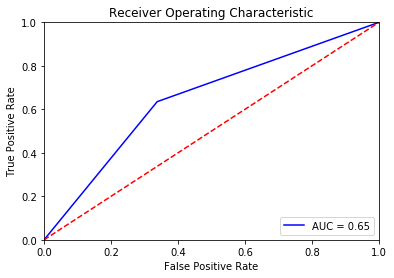

In [156]:
# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# plot the importance

In [104]:
from sklearn.svm import SVC
clf = SVC(kernel = 'linear')

In [105]:
X, y = list(zip(*trainData))

In [ ]:
X

In [ ]:
from sklearn.feature_extraction import DictVectorizer
from sklearn.preprocessing import LabelEncoder
vectorizer = DictVectorizer(dtype=float, sparse=True)
encoder = LabelEncoder()

In [ ]:
X = vectorizer.fit_transform(X)
y = encoder.fit_transform(y)

In [ ]:
clf.fit(X, y)

In [ ]:
cx = clf.coef_
print(cx)

In [ ]:
d = cx.todok() # convert to dictionary of keys format
importance = dict(d.items())
print(importance)

In [ ]:
sorted_importance = sorted(importance.items(), key=lambda x: x[1], reverse=True)

In [ ]:
sorted_importance

In [ ]:
importance_tokens = []
imporance_value = []

In [ ]:
for imp in sorted_importance:
    importance_tokens.append(imp[0][1])
    imporance_value.append(imp[1])

In [ ]:
importance_tokens

In [ ]:
imporance_value

In [ ]:
lst1=importance_tokens[:50]

In [ ]:
lst2=imporance_value[:50]

In [ ]:
dff=pd.DataFrame(list(zip(lst1, lst2)))

In [ ]:
dff.columns=['Tokens','Importance']

In [ ]:
vocab = dict(zip(tfidf.vocabulary_.values(), tfidf.vocabulary_.keys()))
token_values = []
for token in lst1:
    token_values.append(vocab[token])
dff['Trigrmas'] = np.array(token_values)

In [ ]:
dff.sort_values('Importance',inplace=True)

In [ ]:
dff.plot(kind='barh',y='Importance',x='Trigrmas',color='r', figsize=(20,20))